<a href="https://colab.research.google.com/github/FacuNieto/AP_4.0_Arboles/blob/main/Demo_Practica_Arboles_2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

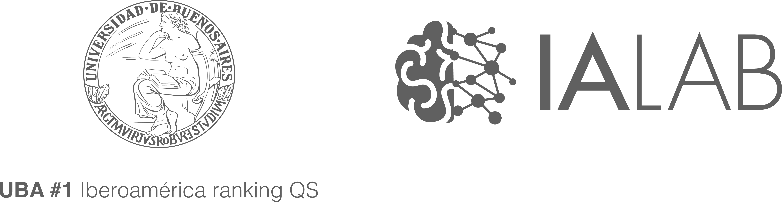

# 1 Ejemplo 1️⃣

Una pequeña farmacéutica produce una nueva y exitosa medicación cuya composición se basa principalmente en componentes de origen vegetal.
Debido al aumento de ventas de este medicamento el fabricante decide mejorar el proceso para que sea más rápido y eficiente maximizando el volumen de fabricación. El área de procesos determinó que uno de los cuellos de botella se encuentra en la clasificación humana de los componentes vegetales debido a que las plantas utilizadas tienen características visuales muy similares, y deben ser clasificadas por un empleado experimentado.

Los componentes vegetales consisten de 3 tipos de flores diferentes:

El área de investigación y desarrollo desarrolló un sistema de visión artificial capaz de calcular:


*  El largo y el ancho del pétalo.
*  El largo y el ancho del sépalo.





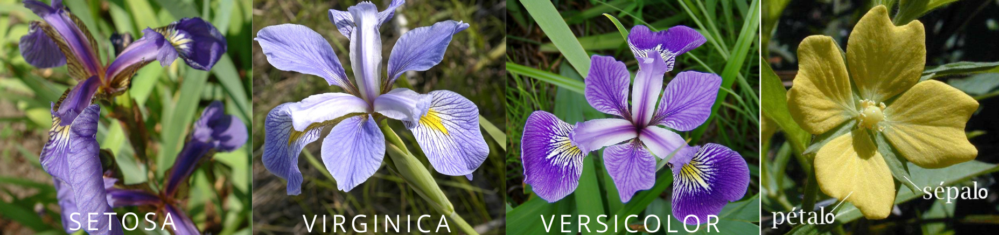

## 1.1 Carga de librerías

In [2]:
# Importamos librerias numpy, pandas y matplotlib
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Importamos dataset
from sklearn.datasets import load_iris

# Importamos algoritmo árbol de decisión y la herramienta para plotear el árbol
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, ConfusionMatrixDisplay, classification_report

## 1.2 Carga, analisis y visualización de dataset.

### 1.2.1 Carga de dataset

In [ ]:
# Cargamos el dataset
iris = load_iris()

In [ ]:
# Visualizamos en un dataframe
iris_df= pd.DataFrame(data=iris['data'], columns=iris['feature_names'])
display(iris_df)

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2
...,...,...,...,...
145,6.7,3.0,5.2,2.3
146,6.3,2.5,5.0,1.9
147,6.5,3.0,5.2,2.0
148,6.2,3.4,5.4,2.3


In [ ]:
# Concatenamos la información de data con target
iris_df_c=pd.DataFrame(data= np.c_[iris.data , iris.target], columns= iris['feature_names'] + ['target'])
display(iris_df_c)

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0.0
1,4.9,3.0,1.4,0.2,0.0
2,4.7,3.2,1.3,0.2,0.0
3,4.6,3.1,1.5,0.2,0.0
4,5.0,3.6,1.4,0.2,0.0
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,2.0
146,6.3,2.5,5.0,1.9,2.0
147,6.5,3.0,5.2,2.0,2.0
148,6.2,3.4,5.4,2.3,2.0


In [ ]:
# Verificar nulls
iris_df_c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sepal length (cm)  150 non-null    float64
 1   sepal width (cm)   150 non-null    float64
 2   petal length (cm)  150 non-null    float64
 3   petal width (cm)   150 non-null    float64
 4   target             150 non-null    float64
dtypes: float64(5)
memory usage: 6.0 KB


### 1.2.2 Visualización

In [ ]:
target_n = []
for i in range(len(iris['target'])):
  target_n.append(iris['target_names'][iris['target'][i]])

In [ ]:
iris_df_graph = iris_df_c.copy()

In [ ]:
iris_df_graph['target_graph'] = pd.DataFrame(target_n)

In [ ]:
iris_df_graph = iris_df_graph.drop('target', axis=1)

In [ ]:
iris_df_graph

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target_graph
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


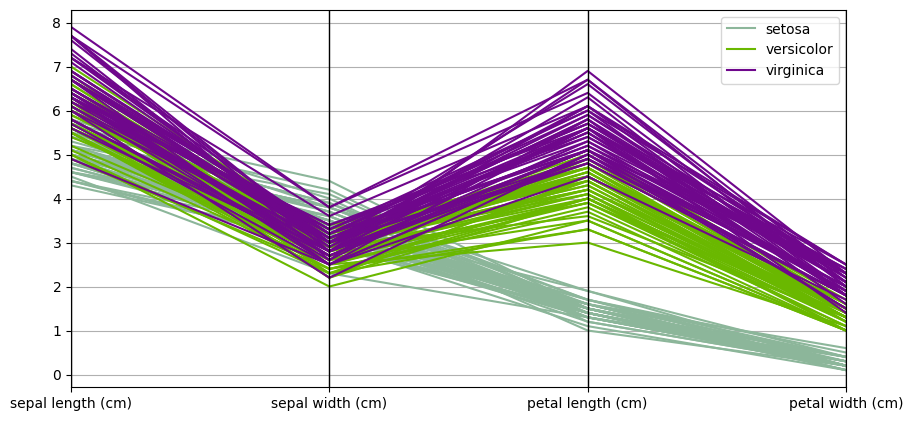

In [ ]:
#@title Coord paralelas
variable_name = 80 #@param {type:"slider", min:1, max:149, step:1}
# Generamos un gráfico de coordenadas paralelas.
plt.rcParams["figure.dpi"] = 100
fig = plt.figure(figsize = (10, 5))
pd.plotting.parallel_coordinates(iris_df_graph[:variable_name],'target_graph')
plt.show()

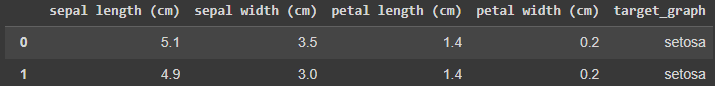

In [ ]:
import plotly.express as px
df = px.data.iris()
fig = px.parallel_coordinates(iris_df_c, color='target',
                              dimensions=['sepal length (cm)', 'sepal width (cm)', 'petal length (cm)', 'petal width (cm)'],
                              color_continuous_scale=px.colors.diverging.Tealrose,
                              color_continuous_midpoint=1)
fig.show()

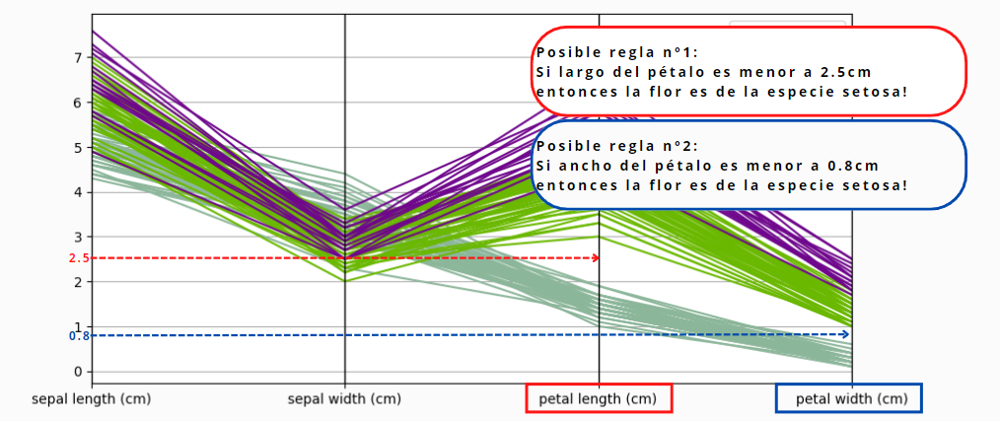

## 1.3 Generación de datos de entrenamiento y prueba

In [ ]:
# Dividiremos el dataset en datos de entrenamiento y de prueba

x= iris_df_c.drop('target', axis = 1)
y= iris_df_c['target']
x_train, x_test ,y_train, y_test = train_test_split( x , y , random_state=3)

## 1.4 Carga y entrenamiento de modelo

In [ ]:
# Entrenamos:
clf = DecisionTreeClassifier(criterion = 'entropy').fit(x_train, y_train)

# Hacemos la predicción:
y_pred = clf.predict(x_test)

# Probamos accuracy:
print('accuracy =' , accuracy_score(y_test,y_pred))
print('precision = ' , precision_score(y_test,y_pred,average='macro'))

accuracy = 0.9736842105263158
precision =  0.9722222222222222


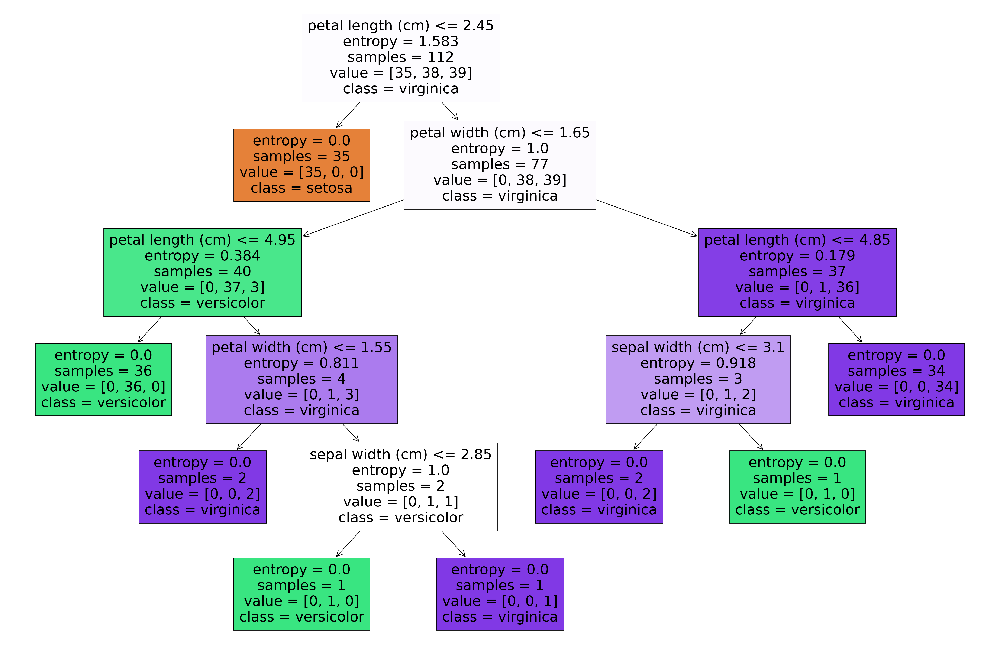

In [ ]:
# Graficamos árbol de decisión.
plt.rcParams["figure.dpi"] = 200
plt.figure(figsize=(30,20))
plot_tree(clf, filled=True, class_names = iris.target_names, feature_names = iris.feature_names)
# plt.savefig('arbol.png')
plt.show()

# 2 Ejemplo 2️⃣

**Cervezas**

## 2.1 Clonamos repositorio y leemos dataset

In [409]:
!git clone https://github.com/FacuNieto/Argentina_Programa_4.0.git

fatal: destination path 'Argentina_Programa_4.0' already exists and is not an empty directory.


In [410]:
df_beer = pd.read_csv('/content/beer_data.csv', delimiter=';')

In [411]:
df_beer

,Nombre,Estilo,Cervecería,Nombre completo,Descripción,ABV,Min IBU,Max IBU,Astringencia,Cuerpo (Body),Alcohol,Amargo (Bitter),Dulce (Sweet),Agrio (Sour),Salado (Salty),Frutas (Fruits),Lupulado (Hoppy),Especias (Spices),Malta (Malty)
0,Honker's Ale,Bitter - English,Goose Island Beer Co.,Goose Island Beer Co. Honker's Ale,"Notes:Golden sunset color, fruity hop aroma, b...",4.3,20,35,14,35,3,53,66,28,1,32,58,1,79
1,Fuller's London Pride,Bitter - English,Fuller Smith & Turner PLC,Fuller Smith & Turner PLC Fuller's London Pride,"Notes:Not just the iconic ale of the capital, ...",4.7,20,35,21,49,9,58,67,32,0,33,101,6,108
2,Bluebird Bitter,Bitter - English,Coniston Brewing Co. Ltd,Coniston Brewing Co. Ltd Bluebird Bitter,Notes:Bluebird is a fine session ale with a li...,4.2,20,35,29,43,15,62,52,47,2,38,101,23,81
3,Spitfire Premium Kentish Ale,Bitter - English,Shepherd Neame Ltd,Shepherd Neame Ltd Spitfire (Premium Ale Export),Notes:This 4.2% Kentish ale (bottle 4.5%) was ...,4.5,20,35,16,22,6,51,29,16,1,15,76,6,61
4,Younger's Special Bitter,Bitter - English,Rogue Ales,Rogue Ales Younger's Special Bitter,Notes:,4.8,20,35,20,69,14,74,44,24,0,20,84,13,89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
730,Saranac Summer Ale,Wheat Beer - American Pale,Matt Brewing Company,Matt Brewing Company Saranac Summer Ale,Notes:Available in the 12 Beers of Summer samp...,4.7,10,35,19,31,4,32,29,70,0,72,49,13,64
731,Sun Block,Wheat Beer - American Pale,Captain Lawrence Brewing Co.,Captain Lawrence Brewing Co. Sun Block Witte,Notes:As the sun starts to peek out from aroun...,4.5,10,35,28,52,11,73,33,82,1,98,103,16,72
732,Funk Blueberry Citrus Wheat,Wheat Beer - American Pale,DuClaw Brewing Company,DuClaw Brewing Company Funk,Notes:The traditional American Wheat Ale serve...,5.0,10,35,18,32,10,21,118,78,3,130,41,3,77
733,Willy Vanilly,Wheat Beer - American Pale,Alpine Beer Company,Alpine Beer Company Willy Vanilly,Notes:The base for this beer is Willy Wheat. T...,5.5,10,35,17,35,11,16,16,28,1,28,21,75,69


* ABV: Contenido de Alcohol por Volumen
* IBU: Unidades Internacionales de Amargura


In [412]:
df_beer.columns

Index(['Nombre', 'Estilo', 'Cervecería', 'Nombre completo', 'Descripción',
       'ABV', 'Min IBU', 'Max IBU', 'Astringencia', 'Cuerpo (Body)', 'Alcohol',
       'Amargo (Bitter)', 'Dulce (Sweet)', 'Agrio (Sour)', 'Salado (Salty)',
       'Frutas (Fruits)', 'Lupulado (Hoppy)', 'Especias (Spices)',
       'Malta (Malty)'],
      dtype='object')

In [413]:
'ABV', 'Min IBU', 'Max IBU', 'Astringencia', 'Cuerpo (Body)', 'Alcohol', 'Lupulado (Hoppy)', 'Malta (Malty)'

('ABV',
 'Min IBU',
 'Max IBU',
 'Astringencia',
 'Cuerpo (Body)',
 'Alcohol',
 'Lupulado (Hoppy)',
 'Malta (Malty)')

In [414]:
# Introducir valores nulos de manera aleatoria
nulos_indices = np.random.choice(df_beer.index, size=50, replace=False)  # Elegir 20 índices aleatorios
df_beer.loc[nulos_indices, 'ABV'] = np.nan  # Colocar valores nulos en Variable1
nulos_indices = np.random.choice(df_beer.index, size=50, replace=False)  # Elegir 20 índices aleatorios

df_beer.loc[nulos_indices, 'Min IBU'] = np.nan  # Colocar valores nulos en Variable1
nulos_indices = np.random.choice(df_beer.index, size=50, replace=False)  # Elegir 20 índices aleatorios

df_beer.loc[nulos_indices, 'Max IBU'] = np.nan  # Colocar valores nulos en Variable2

nulos_indices = np.random.choice(df_beer.index, size=50, replace=False)  # Elegir 20 índices aleatorios
df_beer.loc[nulos_indices, 'Malta (Malty)'] = np.nan  # Colocar valores nulos en Variable3

nulos_indices = np.random.choice(df_beer.index, size=50, replace=False)  # Elegir 20 índices aleatorios
df_beer.loc[nulos_indices, 'Lupulado (Hoppy)'] = np.nan  # Colocar valores nulos en Variable3

nulos_indices = np.random.choice(df_beer.index, size=50, replace=False)  # Elegir 20 índices aleatorios
df_beer.loc[nulos_indices, 'Alcohol'] = np.nan  # Colocar valores nulos en Variable3


# Introducir valores atípicos de manera aleatoria
outlier_indices = np.random.choice(df_beer.index, size=15, replace=False)  # Elegir 10 índices aleatorios
df_beer.loc[outlier_indices, 'ABV'] = df_beer.loc[outlier_indices, 'Min IBU'] * 5  # Introducir valores atípicos en Variable1

outlier_indices = np.random.choice(df_beer.index, size=20, replace=False)  # Elegir 10 índices aleatorios
df_beer.loc[outlier_indices, 'Min IBU'] = df_beer.loc[outlier_indices, 'Min IBU'] * 10  # Introducir valores atípicos en Variable1

outlier_indices = np.random.choice(df_beer.index, size=15, replace=False)  # Elegir 10 índices aleatorios
df_beer.loc[outlier_indices, 'Max IBU'] = df_beer.loc[outlier_indices, 'Max IBU'] * 10  # Introducir valores atípicos en Variable1

outlier_indices = np.random.choice(df_beer.index, size=15, replace=False)  # Elegir 10 índices aleatorios
df_beer.loc[outlier_indices, 'Astringencia'] = df_beer.loc[outlier_indices, 'Astringencia'] * 10  # Introducir valores atípicos en Variable1

outlier_indices = np.random.choice(df_beer.index, size=26, replace=False)  # Elegir 10 índices aleatorios
df_beer.loc[outlier_indices, 'Alcohol'] = df_beer.loc[outlier_indices, 'Alcohol'] * 10  # Introducir valores atípicos en Variable1


In [415]:
df_beer

,Nombre,Estilo,Cervecería,Nombre completo,Descripción,ABV,Min IBU,Max IBU,Astringencia,Cuerpo (Body),Alcohol,Amargo (Bitter),Dulce (Sweet),Agrio (Sour),Salado (Salty),Frutas (Fruits),Lupulado (Hoppy),Especias (Spices),Malta (Malty)
0,Honker's Ale,Bitter - English,Goose Island Beer Co.,Goose Island Beer Co. Honker's Ale,"Notes:Golden sunset color, fruity hop aroma, b...",4.3,20.0,35.0,14,35,3.0,53,66,28,1,32,58.0,1,79.0
1,Fuller's London Pride,Bitter - English,Fuller Smith & Turner PLC,Fuller Smith & Turner PLC Fuller's London Pride,"Notes:Not just the iconic ale of the capital, ...",4.7,20.0,35.0,21,49,9.0,58,67,32,0,33,101.0,6,NaN
2,Bluebird Bitter,Bitter - English,Coniston Brewing Co. Ltd,Coniston Brewing Co. Ltd Bluebird Bitter,Notes:Bluebird is a fine session ale with a li...,4.2,20.0,35.0,29,43,15.0,62,52,47,2,38,101.0,23,NaN
3,Spitfire Premium Kentish Ale,Bitter - English,Shepherd Neame Ltd,Shepherd Neame Ltd Spitfire (Premium Ale Export),Notes:This 4.2% Kentish ale (bottle 4.5%) was ...,4.5,20.0,35.0,16,22,NaN,51,29,16,1,15,76.0,6,61.0
4,Younger's Special Bitter,Bitter - English,Rogue Ales,Rogue Ales Younger's Special Bitter,Notes:,4.8,200.0,35.0,20,69,14.0,74,44,24,0,20,84.0,13,89.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
730,Saranac Summer Ale,Wheat Beer - American Pale,Matt Brewing Company,Matt Brewing Company Saranac Summer Ale,Notes:Available in the 12 Beers of Summer samp...,4.7,10.0,35.0,19,31,4.0,32,29,70,0,72,NaN,13,64.0
731,Sun Block,Wheat Beer - American Pale,Captain Lawrence Brewing Co.,Captain Lawrence Brewing Co. Sun Block Witte,Notes:As the sun starts to peek out from aroun...,4.5,10.0,35.0,28,52,11.0,73,33,82,1,98,103.0,16,72.0
732,Funk Blueberry Citrus Wheat,Wheat Beer - American Pale,DuClaw Brewing Company,DuClaw Brewing Company Funk,Notes:The traditional American Wheat Ale serve...,5.0,10.0,35.0,18,32,10.0,21,118,78,3,130,41.0,3,77.0
733,Willy Vanilly,Wheat Beer - American Pale,Alpine Beer Company,Alpine Beer Company Willy Vanilly,Notes:The base for this beer is Willy Wheat. T...,5.5,10.0,35.0,17,35,11.0,16,16,28,1,28,21.0,75,69.0


In [416]:
# df_beer.plot(figsize=(30,10), subplots=True)
# plt.show()

In [417]:
# df_beer = df_beer.sort_values('Estilo', ascending= True)
# df_beer.reset_index(drop=True, inplace= True)
# df_beer.plot(figsize=(30,10), subplots=True)
# plt.show()

## 2.2 Dos caminos

In [418]:
df_beer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 735 entries, 0 to 734
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Nombre             735 non-null    object 
 1   Estilo             735 non-null    object 
 2   Cervecería         735 non-null    object 
 3   Nombre completo    735 non-null    object 
 4   Descripción        735 non-null    object 
 5   ABV                685 non-null    float64
 6   Min IBU            685 non-null    float64
 7   Max IBU            685 non-null    float64
 8   Astringencia       735 non-null    int64  
 9   Cuerpo (Body)      735 non-null    int64  
 10  Alcohol            685 non-null    float64
 11  Amargo (Bitter)    735 non-null    int64  
 12  Dulce (Sweet)      735 non-null    int64  
 13  Agrio (Sour)       735 non-null    int64  
 14  Salado (Salty)     735 non-null    int64  
 15  Frutas (Fruits)    735 non-null    int64  
 16  Lupulado (Hoppy)   685 non

'ABV', 'Min IBU', 'Max IBU', 'Astringencia', 'Cuerpo (Body)', 'Alcohol', 'Lupulado (Hoppy)', 'Malta (Malty)'

In [419]:
# Eliminamos columnas
columnas_a_eliminar =['Nombre', 'Cervecería', 'Nombre completo', 'Descripción',
                      'Amargo (Bitter)', 'Dulce (Sweet)', 'Agrio (Sour)', 'Salado (Salty)',
                      'Frutas (Fruits)',  'Especias (Spices)']
df_beer = df_beer.drop(columns=columnas_a_eliminar)

In [420]:
# Verificar nulos y tipos de datos
df_beer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 735 entries, 0 to 734
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Estilo            735 non-null    object 
 1   ABV               685 non-null    float64
 2   Min IBU           685 non-null    float64
 3   Max IBU           685 non-null    float64
 4   Astringencia      735 non-null    int64  
 5   Cuerpo (Body)     735 non-null    int64  
 6   Alcohol           685 non-null    float64
 7   Lupulado (Hoppy)  685 non-null    float64
 8   Malta (Malty)     685 non-null    float64
dtypes: float64(6), int64(2), object(1)
memory usage: 51.8+ KB


### 2.2.1 Camino simple

#### 2.2.1.1 Limpieza

In [421]:
# Eliminar filas con valores nulos
df_beer_sin_nulos = df_beer.dropna()

# Mostrar información sobre el DataFrame limpio
print(df_beer_sin_nulos.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 486 entries, 0 to 734
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Estilo            486 non-null    object 
 1   ABV               486 non-null    float64
 2   Min IBU           486 non-null    float64
 3   Max IBU           486 non-null    float64
 4   Astringencia      486 non-null    int64  
 5   Cuerpo (Body)     486 non-null    int64  
 6   Alcohol           486 non-null    float64
 7   Lupulado (Hoppy)  486 non-null    float64
 8   Malta (Malty)     486 non-null    float64
dtypes: float64(6), int64(2), object(1)
memory usage: 38.0+ KB
None


In [422]:
import pandas as pd

# Calcular los valores estadísticos
statistics = df_beer_sin_nulos.describe()
print("Valores estadísticos:")
print(statistics)

# Calcular los valores estadísticos
statistics = df_beer.describe()
print("Valores estadísticos:")
print(statistics)

Valores estadísticos:
              ABV     Min IBU      Max IBU  Astringencia  Cuerpo (Body)  \
count  486.000000  486.000000   486.000000    486.000000     486.000000   
mean     9.558333   26.923868    47.386831     18.911523      48.051440   
std     24.915868   36.364483    67.576322     23.262252      23.396877   
min      0.000000    0.000000    10.000000      1.000000       1.000000   
25%      5.000000   15.000000    30.000000     10.000000      33.250000   
50%      5.800000   20.000000    30.000000     15.000000      43.000000   
75%      7.500000   25.000000    45.000000     21.000000      57.000000   
max    325.000000  400.000000  1000.000000    300.000000     158.000000   

          Alcohol  Lupulado (Hoppy)  Malta (Malty)  
count  486.000000        486.000000     486.000000  
mean    21.537037         43.446502      81.541152  
std     35.475876         27.811816      36.555471  
min      0.000000          0.000000       0.000000  
25%      7.000000         23.000000  

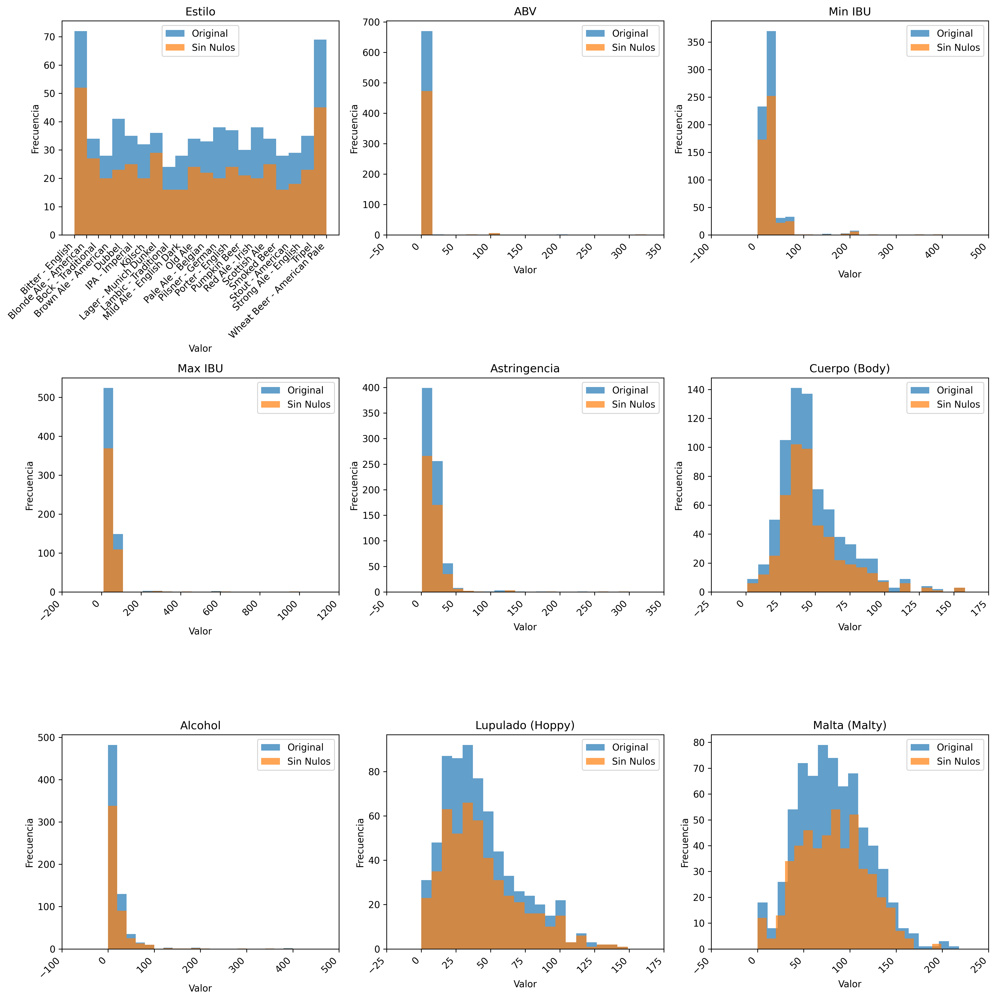

In [423]:
import pandas as pd
import matplotlib.pyplot as plt

# Crear una figura con 9 subplots organizados en 3 filas y 3 columnas
num_columns = 3
num_rows = 3
fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(15, 15))

# Aplanar la matriz de ejes para facilitar el acceso en el bucle
axes = axes.flatten()

# Graficar las distribuciones de cada variable en df_beer
for idx, column in enumerate(df_beer.columns):
    ax = axes[idx]  # Obtener el eje actual
    ax.hist(df_beer[column], bins=20, alpha=0.7, label='Original')
    ax.hist(df_beer_sin_nulos[column], bins=20, alpha=0.7, label='Sin Nulos')
    ax.set_title(column)
    ax.set_ylabel('Frecuencia')
    ax.set_xlabel('Valor')
    ax.legend()

    # Configurar las marcas y etiquetas del eje x
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)

# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()

In [424]:
import pandas as pd
from scipy.stats import zscore

# Definir un umbral para detectar outliers basados en z-score
outlier_threshold = 2

# Calcular los z-scores para las columnas numéricas
z_scores = zscore(df_beer_sin_nulos.select_dtypes(include=['float64', 'int64']))

# Crear un DataFrame de booleanos donde True indica la presencia de outliers
outliers_mask = (z_scores > outlier_threshold).any(axis=1)

# Crear un nuevo DataFrame df_beer_sin_outliers eliminando las filas con outliers
df_beer_sin_outliers = df_beer_sin_nulos[~outliers_mask]

# Imprimir DataFrame sin outliers
print(df_beer_sin_outliers)


                         Estilo  ABV  Min IBU  Max IBU  Astringencia  \
0              Bitter - English  4.3     20.0     35.0            14   
6              Bitter - English  4.7     20.0     35.0            15   
8              Bitter - English  4.0     20.0     35.0            12   
9              Bitter - English  4.3     20.0     35.0             8   
10             Bitter - English  4.2     20.0     35.0            17   
..                          ...  ...      ...      ...           ...   
727  Wheat Beer - American Pale  8.0     10.0     35.0            37   
728  Wheat Beer - American Pale  4.7     10.0     35.0            22   
732  Wheat Beer - American Pale  5.0     10.0     35.0            18   
733  Wheat Beer - American Pale  5.5     10.0     35.0            17   
734  Wheat Beer - American Pale  5.5     10.0     35.0            21   

     Cuerpo (Body)  Alcohol  Lupulado (Hoppy)  Malta (Malty)  
0               35      3.0              58.0           79.0  
6        

In [425]:
df_beer_sin_outliers

,Estilo,ABV,Min IBU,Max IBU,Astringencia,Cuerpo (Body),Alcohol,Lupulado (Hoppy),Malta (Malty)
0,Bitter - English,4.3,20.0,35.0,14,35,3.0,58.0,79.0
6,Bitter - English,4.7,20.0,35.0,15,60,9.0,93.0,97.0
8,Bitter - English,4.0,20.0,35.0,12,83,5.0,85.0,88.0
9,Bitter - English,4.3,20.0,35.0,8,50,2.0,49.0,64.0
10,Bitter - English,4.2,20.0,35.0,17,40,6.0,65.0,88.0
...,...,...,...,...,...,...,...,...,...
727,Wheat Beer - American Pale,8.0,10.0,35.0,37,46,23.0,60.0,73.0
728,Wheat Beer - American Pale,4.7,10.0,35.0,22,30,70.0,11.0,85.0
732,Wheat Beer - American Pale,5.0,10.0,35.0,18,32,10.0,41.0,77.0
733,Wheat Beer - American Pale,5.5,10.0,35.0,17,35,11.0,21.0,69.0


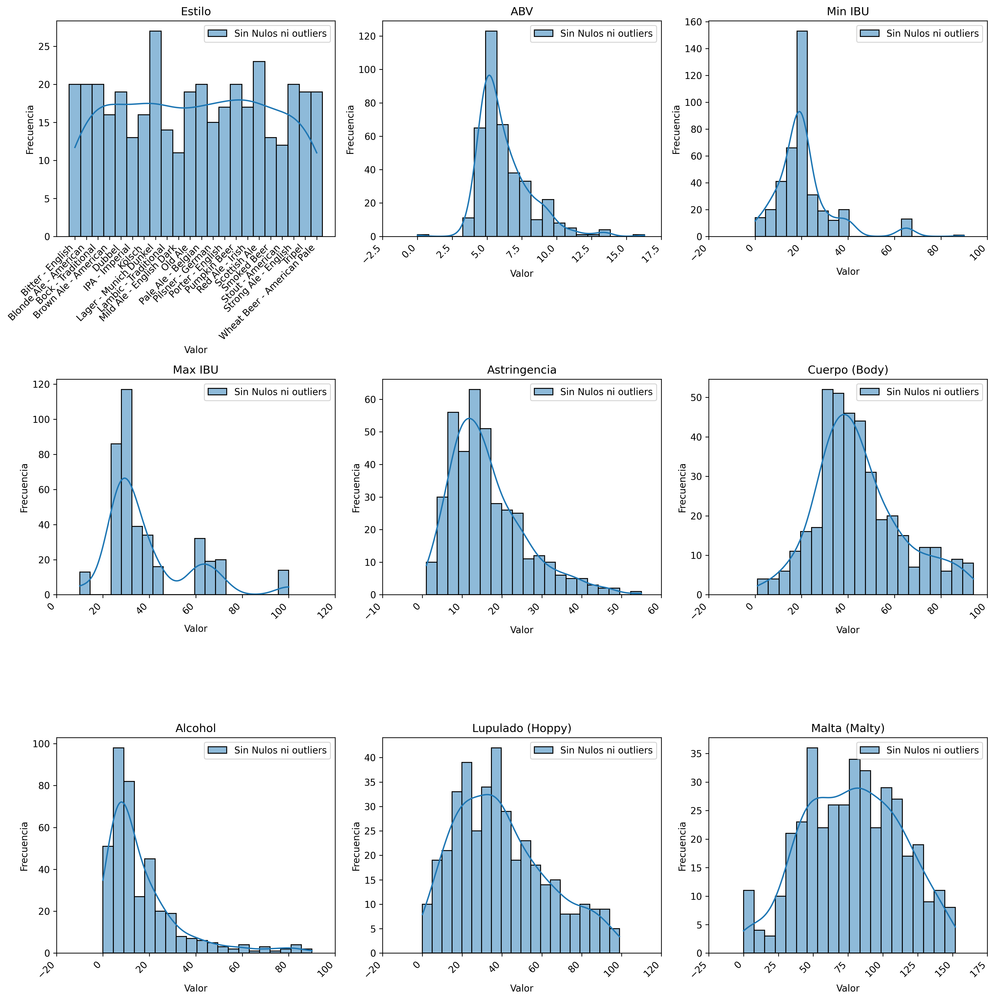

In [426]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Crear una figura con 9 subplots organizados en 3 filas y 3 columnas
num_columns = 3
num_rows = 3
fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(15, 15))

# Aplanar la matriz de ejes para facilitar el acceso en el bucle
axes = axes.flatten()

# Graficar las distribuciones de cada variable en df_beer
for idx, column in enumerate(df_beer.columns):
    ax = axes[idx]  # Obtener el eje actual
    sns.histplot(df_beer_sin_outliers[column], bins=20, ax=ax, label='Sin Nulos ni outliers', kde=True)
    ax.set_title(column)
    ax.set_ylabel('Frecuencia')
    ax.set_xlabel('Valor')
    ax.legend()

    # Configurar las marcas y etiquetas del eje x
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)

# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()


#### 2.2.2.1 Curación

##### Encoding de variables

In [427]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Crear una instancia del codificador de etiquetas
label_encoder = LabelEncoder()

# Crear una copia del DataFrame para evitar la advertencia
df_beer_sin_outliers_copy = df_beer_sin_outliers.copy()

# Codificar las etiquetas y asignarlas utilizando .loc en la copia
df_beer_sin_outliers_copy.loc[:, 'Estilo_encoded'] = label_encoder.fit_transform(df_beer_sin_outliers_copy['Estilo'])

# Imprimir el DataFrame con la columna 'Estilo_encoded'
df_beer_sin_outliers_copy


,Estilo,ABV,Min IBU,Max IBU,Astringencia,Cuerpo (Body),Alcohol,Lupulado (Hoppy),Malta (Malty),Estilo_encoded
0,Bitter - English,4.3,20.0,35.0,14,35,3.0,58.0,79.0,0
6,Bitter - English,4.7,20.0,35.0,15,60,9.0,93.0,97.0,0
8,Bitter - English,4.0,20.0,35.0,12,83,5.0,85.0,88.0,0
9,Bitter - English,4.3,20.0,35.0,8,50,2.0,49.0,64.0,0
10,Bitter - English,4.2,20.0,35.0,17,40,6.0,65.0,88.0,0
...,...,...,...,...,...,...,...,...,...,...
727,Wheat Beer - American Pale,8.0,10.0,35.0,37,46,23.0,60.0,73.0,21
728,Wheat Beer - American Pale,4.7,10.0,35.0,22,30,70.0,11.0,85.0,21
732,Wheat Beer - American Pale,5.0,10.0,35.0,18,32,10.0,41.0,77.0,21
733,Wheat Beer - American Pale,5.5,10.0,35.0,17,35,11.0,21.0,69.0,21


In [428]:
# Crear un diccionario de mapeo de etiquetas originales a codificaciones
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

# Obtener la lista de nombres de clases ordenados por posición
class_names_ordered = [class_name for class_name, class_index in sorted(label_mapping.items(), key=lambda item: item[1])]

##### Separar en caracteristicas (x) y etiquetas (y)


In [429]:
# Separar las características (X) y las etiquetas (Y)
X = df_beer_sin_outliers_copy[['ABV', 'Min IBU', 'Max IBU', 'Astringencia', 'Cuerpo (Body)', 'Alcohol', 'Lupulado (Hoppy)', 'Malta (Malty)']]
Y = df_beer_sin_outliers_copy['Estilo_encoded']

#### 2.2.1.3 Creación de modelo 1



In [430]:
# Dividiremos el dataset en datos de entrenamiento y de prueba
x_train, x_test ,y_train, y_test = train_test_split( X , Y , random_state=10)

In [431]:
# Entrenamos:
clf = DecisionTreeClassifier(criterion = 'entropy', max_depth= 6).fit(x_train, y_train)

# Hacemos la predicción:
y_pred = clf.predict(x_test)

# Probamos accuracy:
print('accuracy =' , accuracy_score(y_test,y_pred))

accuracy = 0.8469387755102041


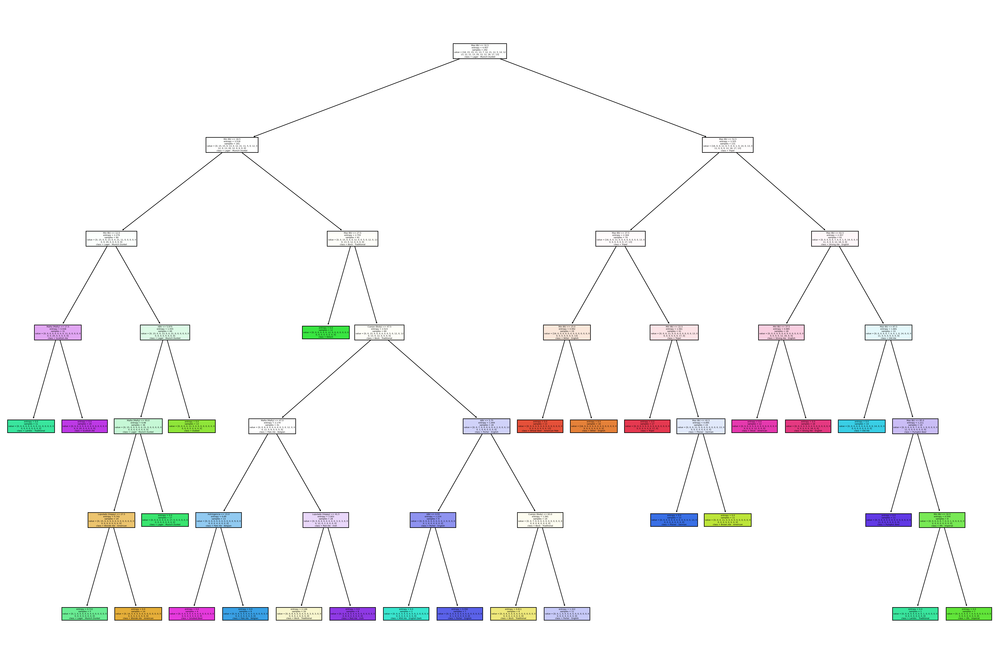

In [432]:
# Graficamos árbol de decisión.
plt.rcParams["figure.dpi"] = 300
plt.figure(figsize=(30,20))
plot_tree(clf, filled=True, feature_names = X.columns, class_names = class_names_ordered)
# plt.savefig('arbol.png')
plt.show()

### 2.2.2 Camino "medio"

#### 2.2.2.1 Limpieza

In [433]:
import pandas as pd
from scipy.stats import zscore

# Definir un umbral para detectar outliers basados en z-score
outlier_threshold = 2

# Calcular los z-scores para las columnas numéricas
z_scores = zscore(df_beer.select_dtypes(include=['float64', 'int64']),nan_policy= 'omit')

# Crear un DataFrame de booleanos donde True indica la presencia de outliers
outliers_mask = (z_scores > outlier_threshold) | (z_scores < -outlier_threshold)

# Calcular las medias de las columnas numéricas
column_means = df_beer.select_dtypes(include=['float64', 'int64']).mean()

# Crear un DataFrame corregido a partir del original
df_beer_sin_outliers_2 = df_beer.copy()

# Iterar sobre las columnas numéricas y reemplazar los valores atípicos con las medias
for column in column_means.index:
    print(column, round(column_means[column],5))
    df_beer_sin_outliers_2.loc[outliers_mask[column], column] = column_means[column]
    # df_beer_corrected.loc[outliers_mask[column], column] = column_means[column]



ABV 8.83872
Min IBU 26.48613
Max IBU 46.82482
Astringencia 19.32109
Cuerpo (Body) 47.84626
Alcohol 20.49781
Lupulado (Hoppy) 42.93869
Malta (Malty) 81.16642


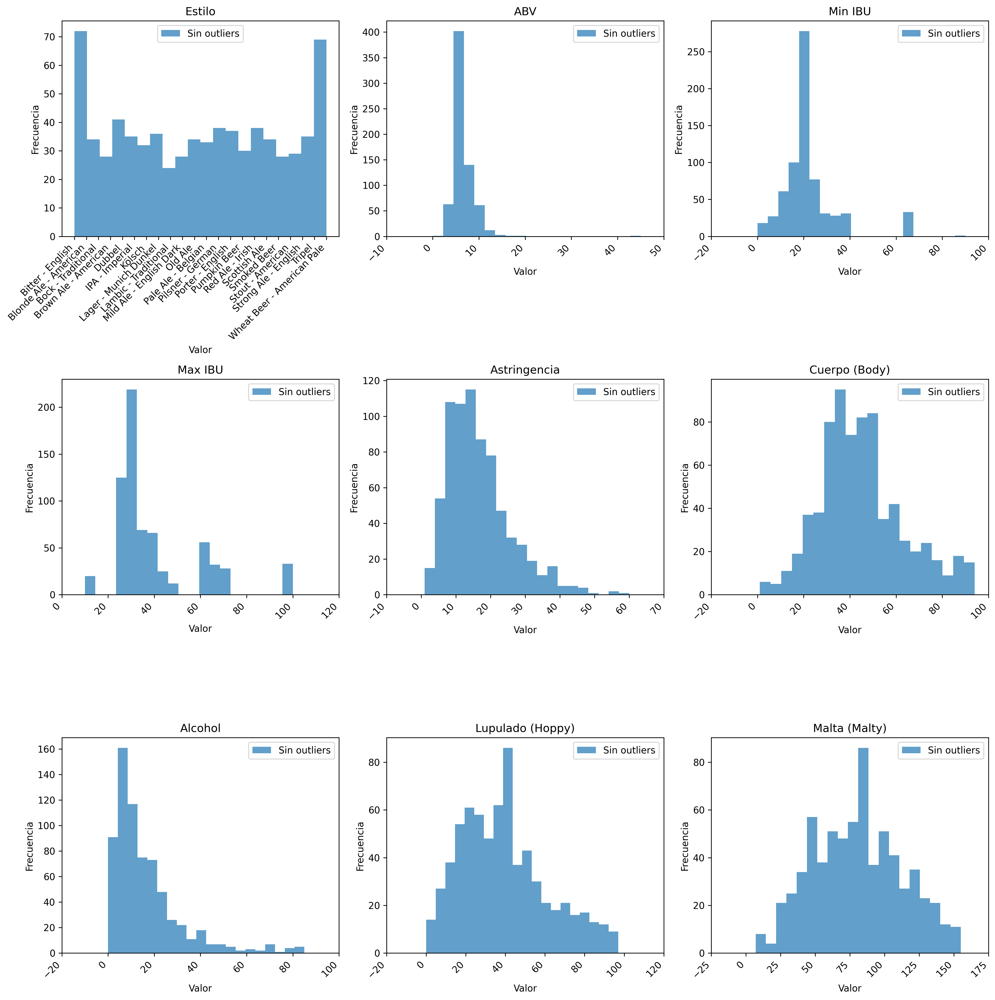

In [434]:
import pandas as pd
import matplotlib.pyplot as plt

# Crear una figura con 9 subplots organizados en 3 filas y 3 columnas
num_columns = 3
num_rows = 3
fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(15, 15))

# Aplanar la matriz de ejes para facilitar el acceso en el bucle
axes = axes.flatten()

# Graficar las distribuciones de cada variable en df_beer
for idx, column in enumerate(df_beer.columns):
    ax = axes[idx]  # Obtener el eje actual
    ax.hist(df_beer_sin_outliers_2[column], bins=20, alpha=0.7, label='Sin outliers')
    ax.set_title(column)
    ax.set_ylabel('Frecuencia')
    ax.set_xlabel('Valor')
    ax.legend()

    # Configurar las marcas y etiquetas del eje x
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)

# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()

In [435]:
# Reemplazar los valores NaN por las medias de las columnas
df_beer_limpio_2 = df_beer_sin_outliers_2.fillna(column_means)

In [436]:
print('Limpio y con reemplazo de nan y ouliers:')
print('---------------------------------------------------')
df_beer_limpio_2.info()

print(' ')
print('Dataset crudo: ')
print('---------------------------------------------------')
df_beer.info()

Limpio y con reemplazo de nan y ouliers:
---------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 735 entries, 0 to 734
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Estilo            735 non-null    object 
 1   ABV               735 non-null    float64
 2   Min IBU           735 non-null    float64
 3   Max IBU           735 non-null    float64
 4   Astringencia      735 non-null    float64
 5   Cuerpo (Body)     735 non-null    float64
 6   Alcohol           735 non-null    float64
 7   Lupulado (Hoppy)  735 non-null    float64
 8   Malta (Malty)     735 non-null    float64
dtypes: float64(8), object(1)
memory usage: 51.8+ KB
 
Dataset crudo: 
---------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 735 entries, 0 to 734
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------ 

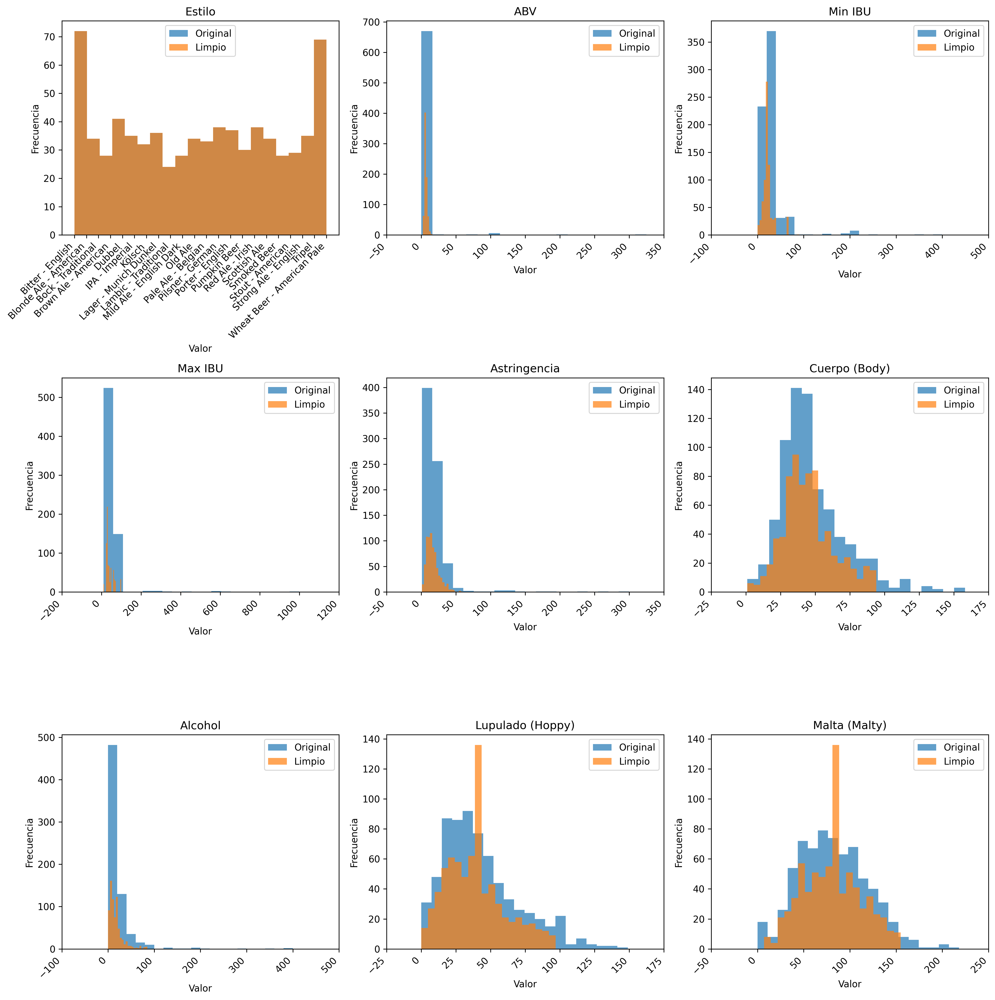

In [437]:
import pandas as pd
import matplotlib.pyplot as plt

# Crear una figura con 9 subplots organizados en 3 filas y 3 columnas
num_columns = 3
num_rows = 3
fig, axes = plt.subplots(nrows=num_rows, ncols=num_columns, figsize=(15, 15))

# Aplanar la matriz de ejes para facilitar el acceso en el bucle
axes = axes.flatten()

# Graficar las distribuciones de cada variable en df_beer
for idx, column in enumerate(df_beer.columns):
    ax = axes[idx]  # Obtener el eje actual
    ax.hist(df_beer[column], bins=20, alpha=0.7, label='Original')
    ax.hist(df_beer_limpio_2[column], bins=20, alpha=0.7, label='Limpio')
    ax.set_title(column)
    ax.set_ylabel('Frecuencia')
    ax.set_xlabel('Valor')
    ax.legend()

    # Configurar las marcas y etiquetas del eje x
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)

# Ajustar el espaciado entre los subplots
plt.tight_layout()
plt.show()

#### 2.2.2.2 Curación

##### Encoding de variables

In [438]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Crear una instancia del codificador de etiquetas
label_encoder = LabelEncoder()

# Crear una copia del DataFrame para evitar la advertencia
df_beer_limpio_2_copy = df_beer_limpio_2.copy()

# Codificar las etiquetas y asignarlas utilizando .loc en la copia
df_beer_limpio_2_copy.loc[:, 'Estilo_encoded'] = label_encoder.fit_transform(df_beer_limpio_2_copy['Estilo'])

# Imprimir el DataFrame con la columna 'Estilo_encoded'
df_beer_limpio_2_copy


,Estilo,ABV,Min IBU,Max IBU,Astringencia,Cuerpo (Body),Alcohol,Lupulado (Hoppy),Malta (Malty),Estilo_encoded
0,Bitter - English,4.3,20.000000,35.0,14.0,35.0,3.00000,58.000000,79.000000,0
1,Bitter - English,4.7,20.000000,35.0,21.0,49.0,9.00000,42.938686,81.166423,0
2,Bitter - English,4.2,20.000000,35.0,29.0,43.0,15.00000,42.938686,81.166423,0
3,Bitter - English,4.5,20.000000,35.0,16.0,22.0,20.49781,76.000000,61.000000,0
4,Bitter - English,4.8,26.486131,35.0,20.0,69.0,14.00000,84.000000,89.000000,0
...,...,...,...,...,...,...,...,...,...,...
730,Wheat Beer - American Pale,4.7,10.000000,35.0,19.0,31.0,4.00000,42.938686,64.000000,21
731,Wheat Beer - American Pale,4.5,10.000000,35.0,28.0,52.0,11.00000,42.938686,72.000000,21
732,Wheat Beer - American Pale,5.0,10.000000,35.0,18.0,32.0,10.00000,41.000000,77.000000,21
733,Wheat Beer - American Pale,5.5,10.000000,35.0,17.0,35.0,11.00000,21.000000,69.000000,21


In [439]:
# Crear un diccionario de mapeo de etiquetas originales a codificaciones
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

# Obtener la lista de nombres de clases ordenados por posición
class_names_ordered = [class_name for class_name, class_index in sorted(label_mapping.items(), key=lambda item: item[1])]

##### Separar en caracteristicas (x) y etiquetas (y)


In [440]:
# Separar las características (X) y las etiquetas (Y)
X = df_beer_limpio_2_copy[['ABV', 'Min IBU', 'Max IBU', 'Astringencia', 'Cuerpo (Body)', 'Alcohol', 'Lupulado (Hoppy)', 'Malta (Malty)']]
Y = df_beer_limpio_2_copy['Estilo_encoded']

#### 2.2.2.3 Creación de modelo 2



In [442]:
# Dividiremos el dataset en datos de entrenamiento y de prueba
x_train, x_test ,y_train, y_test = train_test_split( X , Y , random_state= 4 )

In [443]:
# Dividiremos el dataset en datos de entrenamiento y de prueba
x_train, x_test ,y_train, y_test = train_test_split( X , Y , random_state=4)
# Entrenamos:
clf = DecisionTreeClassifier(criterion = 'entropy', max_depth= 8).fit(x_train, y_train)

# Hacemos la predicción:
y_pred = clf.predict(x_test)

# Probamos accuracy:
print('accuracy =' , accuracy_score(y_test,y_pred))

accuracy = 0.8152173913043478


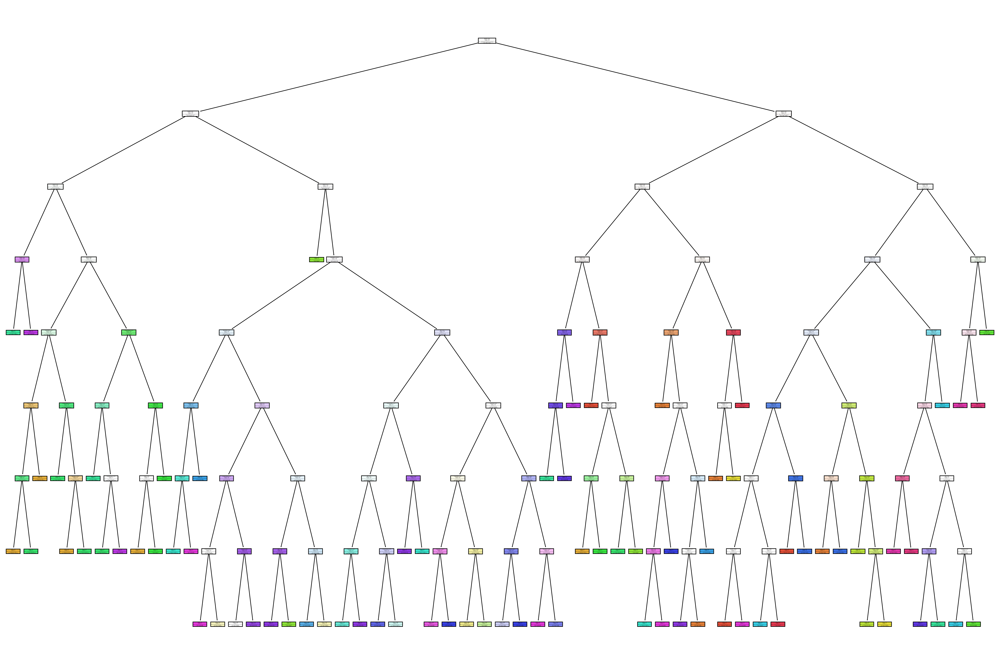

In [444]:
# Graficamos árbol de decisión.
plt.rcParams["figure.dpi"] = 300
plt.figure(figsize=(30,20))
plot_tree(clf, filled=True, feature_names = X.columns, class_names = class_names_ordered)
# plt.savefig('arbol.png')
plt.show()

## 2.3 Consideraciones

* El modelo 1 fue realizado utilizando una base de datos procesada con un enfoque simple de eliminación de datos atípicos y nulos llevando la base de datos prácticamente a la mitad de ejemplos.
* Para el modelo 2 se utilizó un enfoque basado en la imputación de la media de todos los datos de la característica correspondiente, manteniendo la cantidad de ejemplos.
* El modelo 1 tiene una ligera mejor performance que el modelo 2

¿Qué pasó? 🤔❓

La imputación por la media, no es necesariamente el mejor enfoque, sobre todo en un dataset con tantas clases!
Generalmente se puede utilizar, sobre todo cuando hay pocos datos y no conocemos bien la naturaleza de la variable.
En este caso estamos obviando las medias de los valores que toma esa característica por clase, simplemente tomamos las medias de todas las clases!

Como todo, se requieren pruebas de performance tanto para los datos de prueba como para el modelo en producción ya que no existe una regla de oro a la hora de tomar el camino del preprocesamiento de los datos. Cada dataset es un mundo…


¿Cómo podría mejorar? 🧐

Inicialmente se podría probar con la imputación de la media por característica y por clase, esto generalmente es más preciso y mejora la performance. Esta estrategia podría proporcionar imputaciones más precisas y realistas, ya que tomaría en cuenta las características únicas de cada clase en lugar de tratar todas las clases por igual.

También existen otros caminos, como por ejemplo el de la imputación por regresión. En este caso se debe entrenar un modelo regresor que nos ayude a reemplazar los valores atípicos y nulos basados en el conjunto de características del dataset, una vez reemplazados los valores se puede entrenar el modelo que utilizaremos. Esto es especialmente útil si ,al realizar la inferencia también se obtienen datos anómalos.




## 2.4 Predecir resultado

In [445]:
#@markdown #Predictor de resultados
#@markdown Para predecir el tipo de cerveza ingrese los siguientes datos:

#@markdown Contenido de Alcohol por Volumen:
ABV = 8.3 # @param {type:"number"}

#@markdown Unidades Internacionales de Amargura (Min)
Min_IBU = 30 # @param {type:"number"}

#@markdown Unidades Internacionales de Amargura (Max)
Max_IBU = 65 # @param {type:"number"}

#@markdown Nivel de astringencia
Astringencia = 3 # @param {type:"number"}

#@markdown Cuerpo
Cuerpo = 37 # @param {type:"number"}


#@markdown Nivel de alcohol
Alcohol = 27 # @param {type:"number"}


#@markdown Lupulado
Lupulado = 22 # @param {type:"number"}

#@markdown Malta
Malta = 72 # @param {type:"number"}

entrada = [ABV, Min_IBU, Max_IBU, Astringencia, Cuerpo, Alcohol, Lupulado, Malta]

entrada = pd.DataFrame(np.array(entrada).reshape(1, 8))
entrada.columns = ['ABV', 'Min IBU', 'Max IBU', 'Astringencia', 'Cuerpo (Body)', 'Alcohol', 'Lupulado (Hoppy)', 'Malta (Malty)']
y_pred = clf.predict(entrada)

print(class_names_ordered[y_pred[0]])

Old Ale


# Links 🎓💻

https://scikit-learn.org/stable/datasets/toy_dataset.html

https://es.wikipedia.org/wiki/Conjunto_de_datos_flor_iris

https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html


Tener en cuenta:

- Los datos de Iris fueron tomados el mismo día, con lo que eso implica (poca generalización).

- El dataset beer fué modificado y reducido anteriormente a los fines de simplificar el análisis.

- No hablamos de métricas

Formulario 😎👍🏻

https://forms.gle/Zbn8qVbed8NzuttA6